## Imports

In [1]:
import sys
sys.path.append('../../')
import numpy as np
import torch
from torchvision import transforms
from matplotlib import pyplot as plt
from tqdm.notebook import tqdm
from PIL import Image, ImageOps
import matplotlib.patches as patches
from scipy.spatial.transform import Rotation
import pandas as pd
from scipy.spatial import distance
import time
import os
import math
import scipy.io as sio
import random
from utils.renderer import Renderer
from utils.image_operations import expand_bbox_rectangle
from utils.pose_operations import get_pose
from fpn_faster_rcnn_model import FacePoseBBoxFreeModel
from model_loader import load_model
from data_loader_lmdb import LMDBDataLoader
from dataclasses import dataclass

np.set_printoptions(suppress=True)

torch.random.manual_seed(42)
np.random.seed(42)

@dataclass
class Config:
    batch_size: int
    pin_memory: bool
    workers: int
    pose_mean: np.array
    pose_stddev: np.array
    noise_augmentation: bool
    contrast_augmentation: bool
    threed_68_points: str
    distributed: bool

## Create the renderer

In [2]:
renderer = Renderer(
    vertices_path="../../pose_references/vertices_trans.npy", 
    triangles_path="../../pose_references/triangles.npy"
)

threed_points = np.load('../../pose_references/reference_3d_68_points_trans.npy')

## Load model weights and pose mean and std deviation
To test other models, change MODEL_PATH along the the POSE_MEAN and POSE_STDDEV used for training

To customize bounding boxes, change the BBOX_X_FACTOR, BBOX_Y_FACTOR or EXPAND_FOREHEAD

In [3]:
transform = transforms.Compose([transforms.ToTensor()])

# bounding box customization
# how much to expand in the width
BBOX_X_FACTOR = 1.1
# how much to expand in height
BBOX_Y_FACTOR = 1.1
# how much to expand the forehead
EXPAND_FOREHEAD = 0.3

DEPTH = 18
MAX_SIZE = 1400
MIN_SIZE = 600

POSE_MEAN = "../../models/WIDER_train_pose_mean_v1.npy"
POSE_STDDEV = "../../models/WIDER_train_pose_stddev_v1.npy"
MODEL_PATH = "../../models/img2pose_v1.pth"

pose_mean = np.load(POSE_MEAN)
pose_stddev = np.load(POSE_STDDEV)

pose_bb_free_model = FacePoseBBoxFreeModel(
    DEPTH, MIN_SIZE, MAX_SIZE, 
    pose_mean=pose_mean, pose_stddev=pose_stddev,
    threed_68_points=threed_points,    
    bbox_x_factor=BBOX_X_FACTOR,
    bbox_y_factor=BBOX_Y_FACTOR,
    expand_forehead=EXPAND_FOREHEAD,
)
load_model(pose_bb_free_model.fpn_model, MODEL_PATH, cpu_mode=str(pose_bb_free_model.device) == "cpu", model_only=True)
pose_bb_free_model.evaluate()

Model will use 1 GPUs!


## Load the images from the LMDB file

In [4]:
LMDB_FILE = "../../datasets/lmdb/WIDER_val_annotations.lmdb"

# load images that were already compressed from json list to lmdb file
lmdb_data_loader = LMDBDataLoader(
    Config(
        batch_size=1,
        pin_memory=True,
        workers=1,
        pose_mean=pose_mean,
        pose_stddev=pose_stddev,
        noise_augmentation=False,
        contrast_augmentation=False,
        threed_68_points='../../pose_references/reference_3d_68_points_trans.npy',
        distributed=False
    ),
    LMDB_FILE,
    train=True,
)

## Visualize predictions

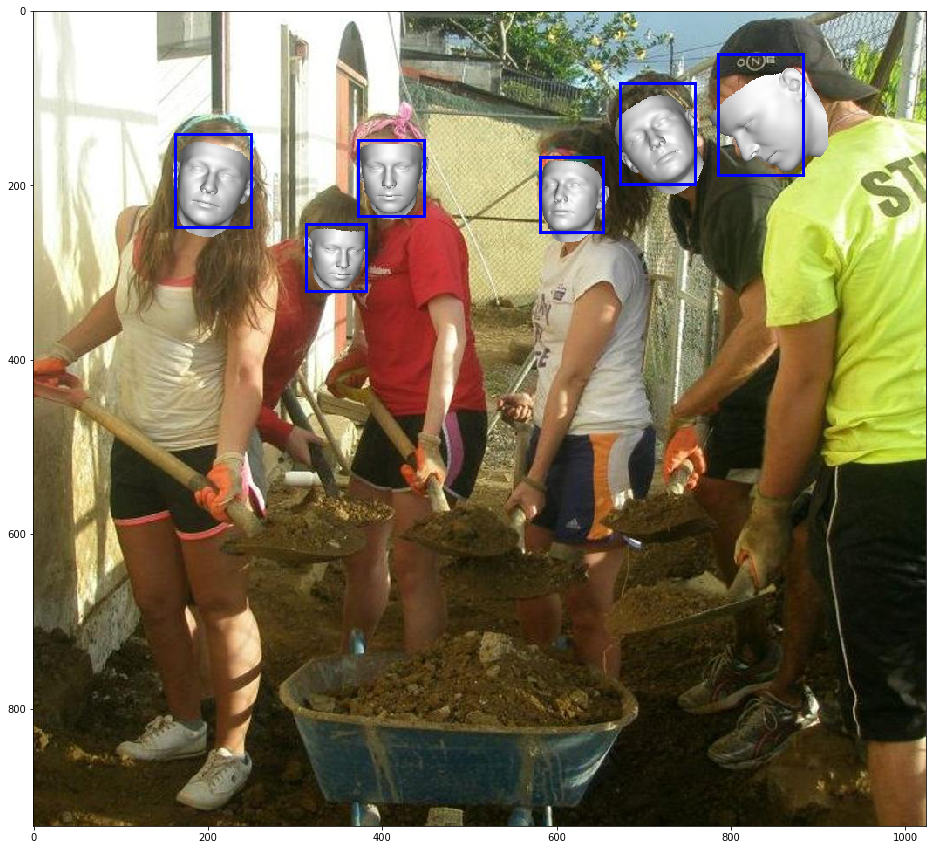

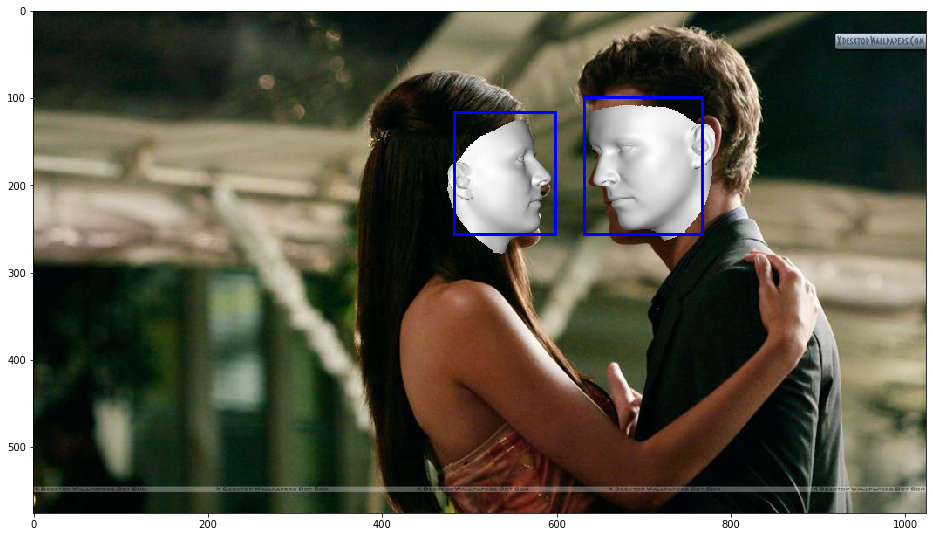

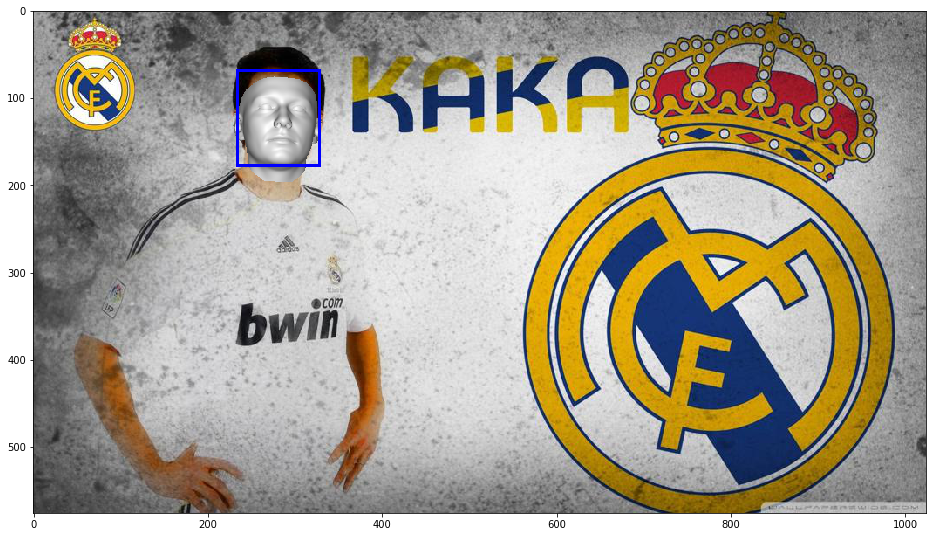

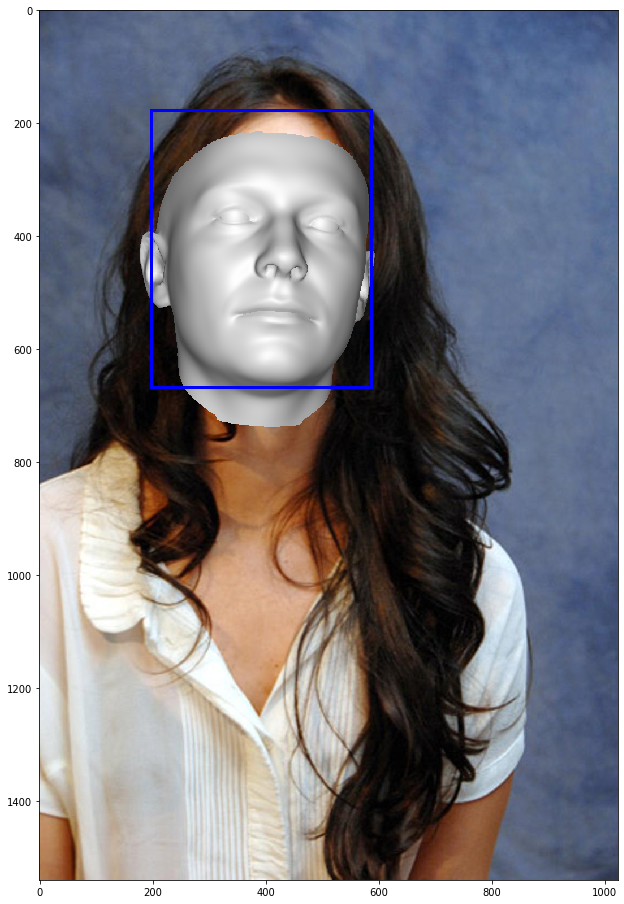

<Figure size 1152x1152 with 0 Axes>

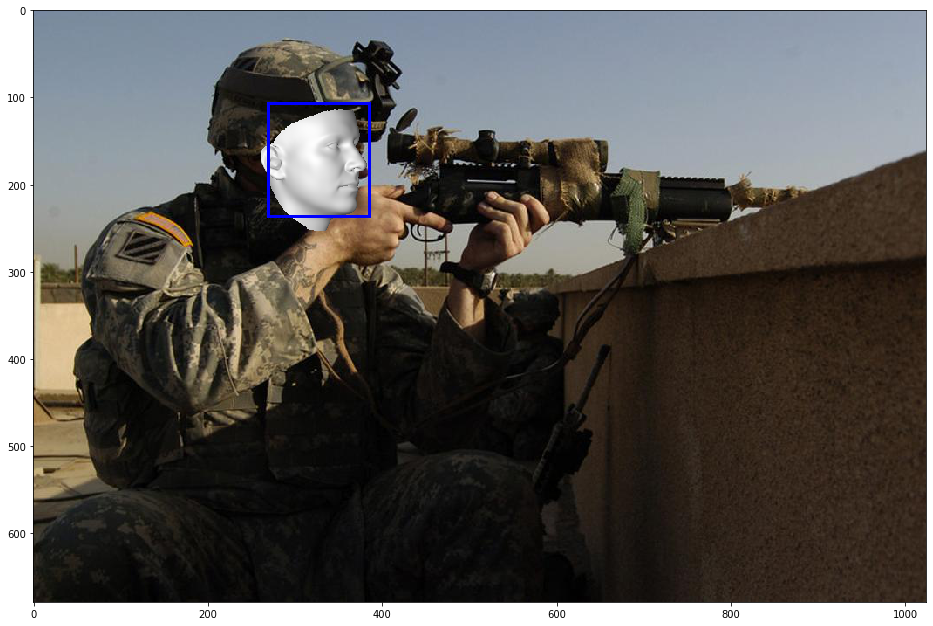

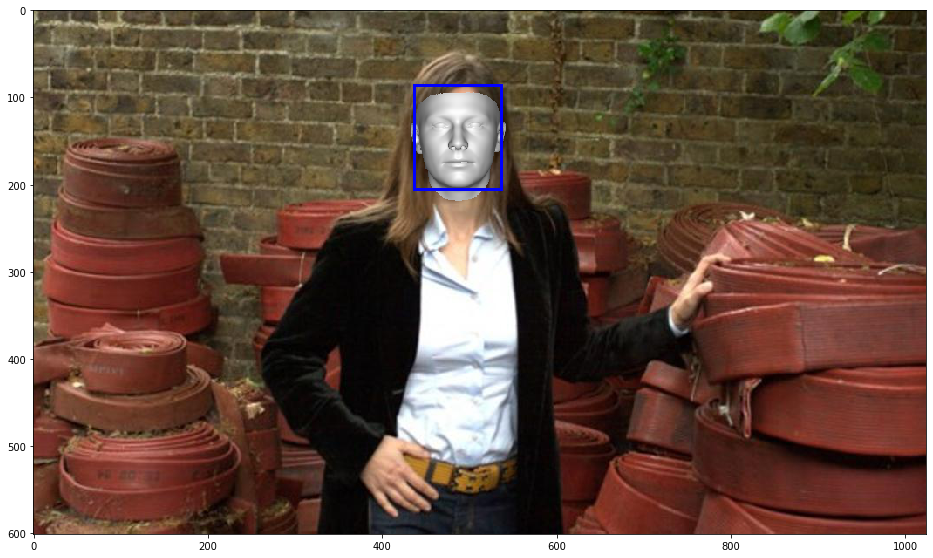

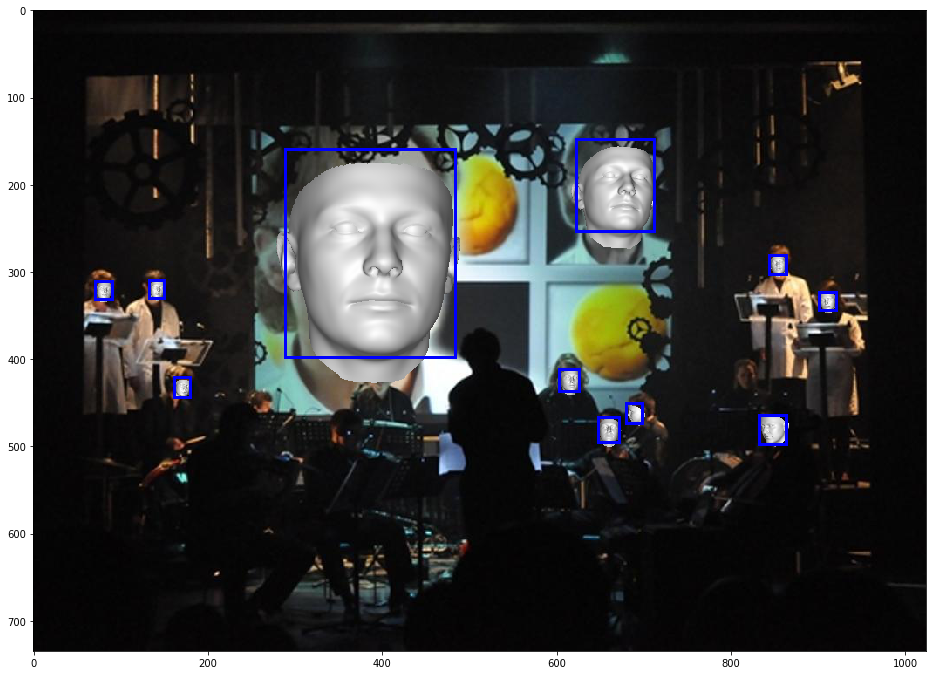

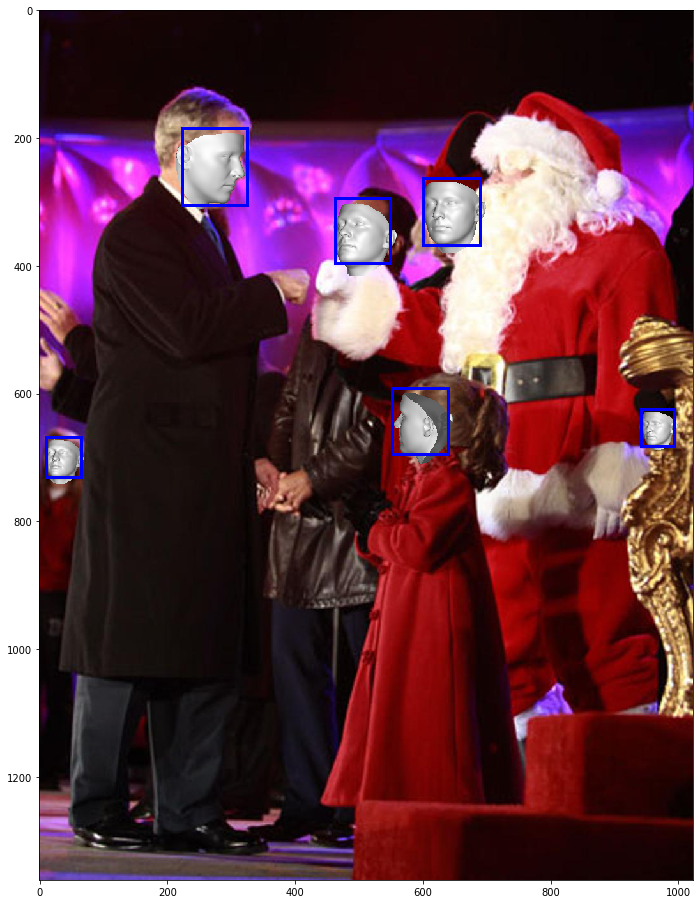

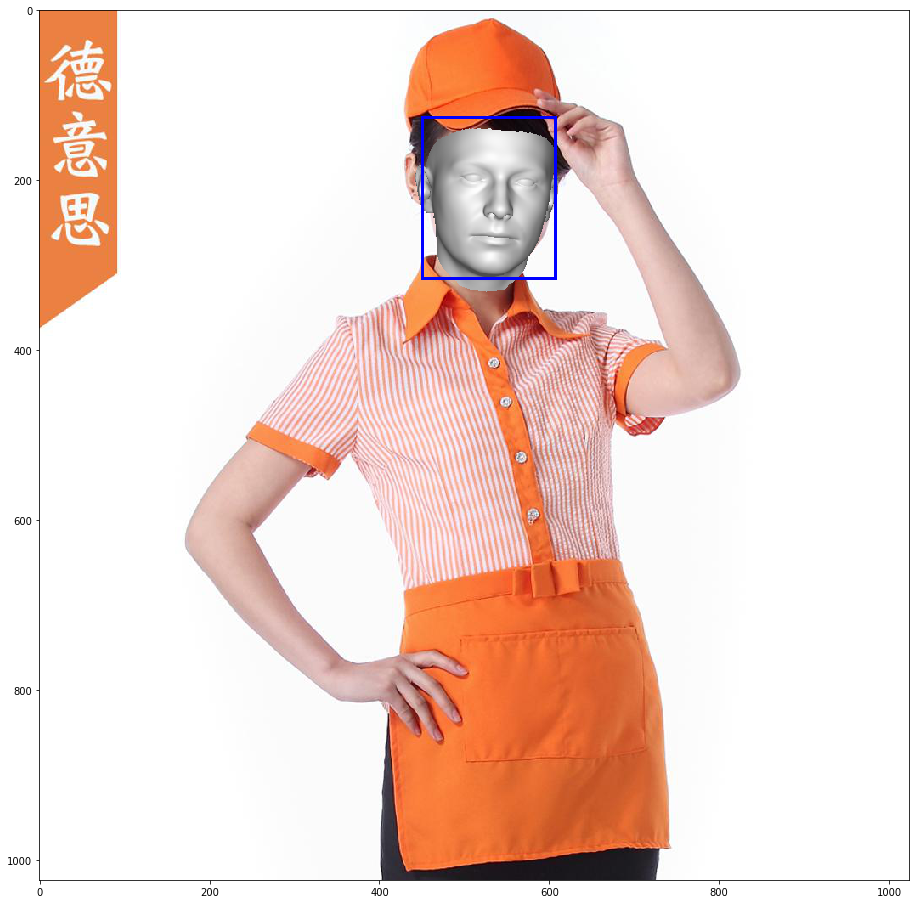

...

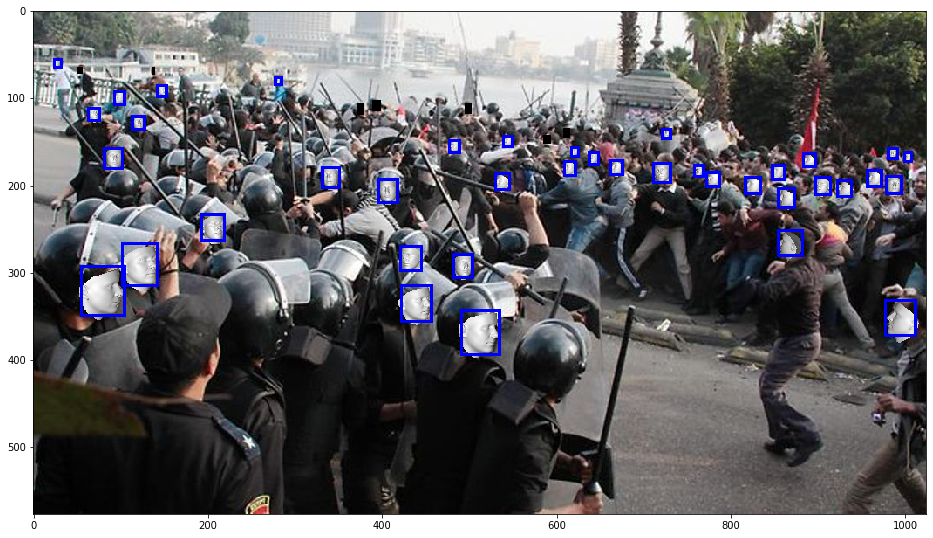

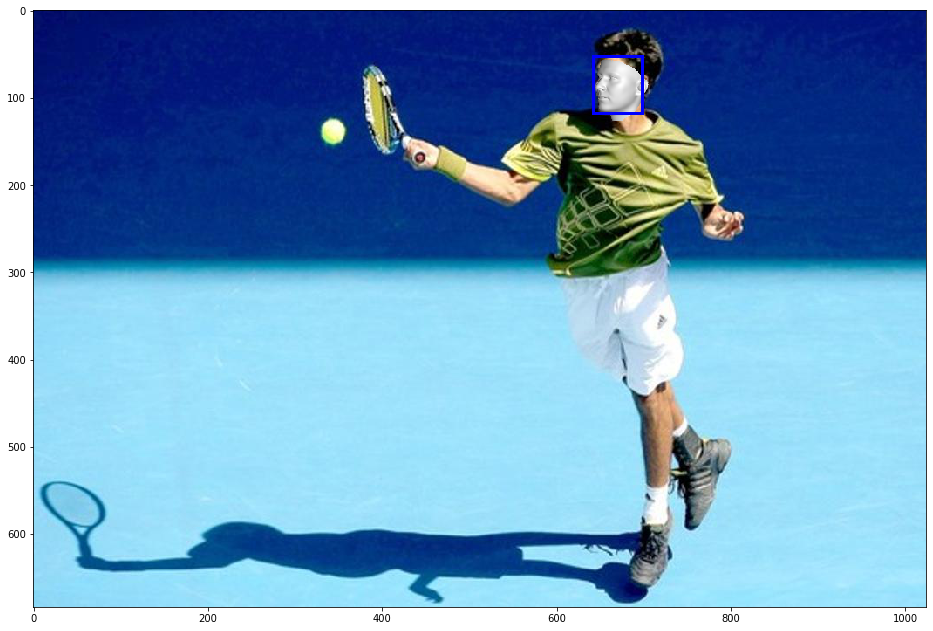

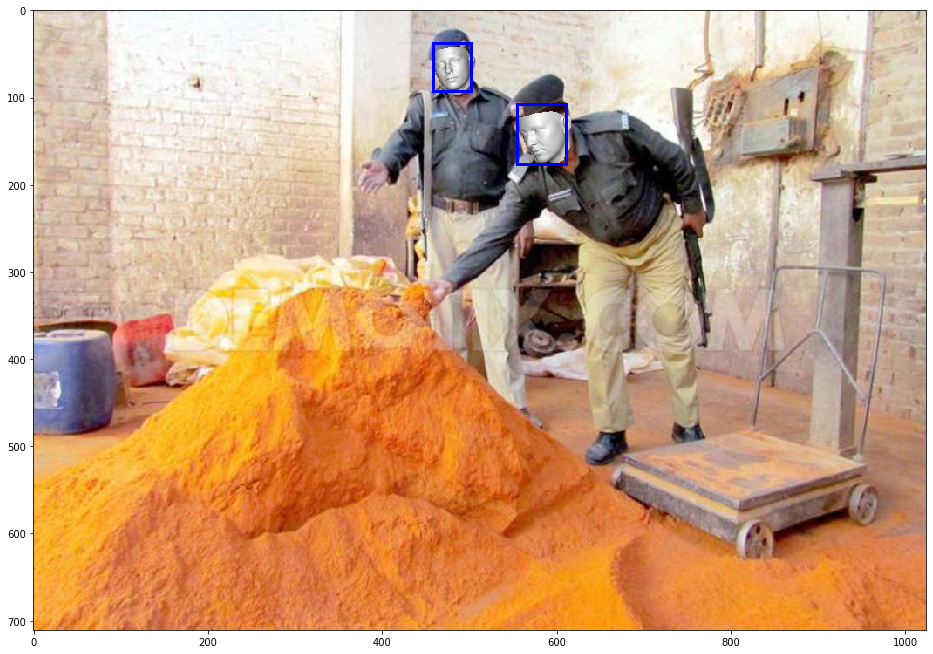

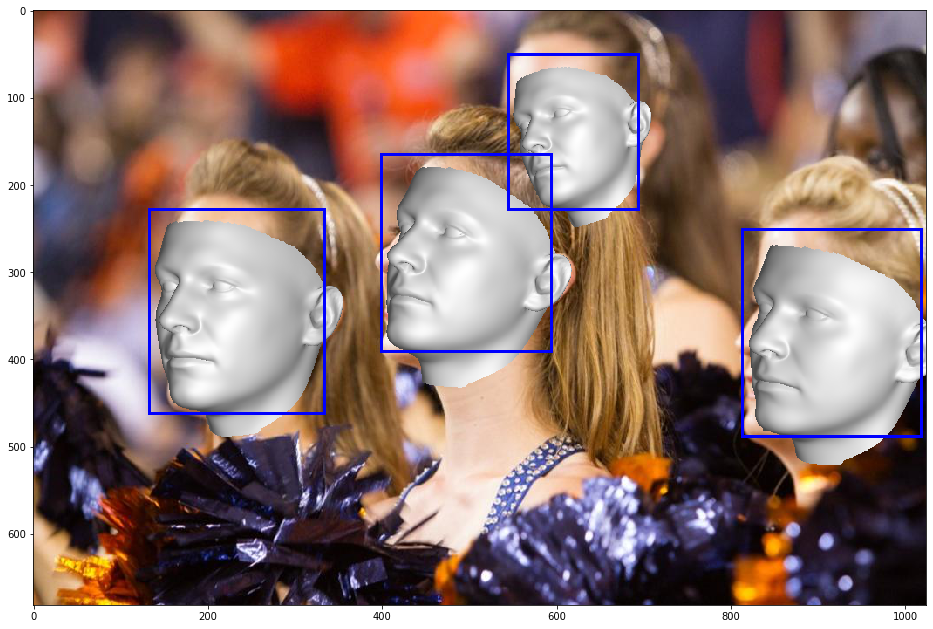

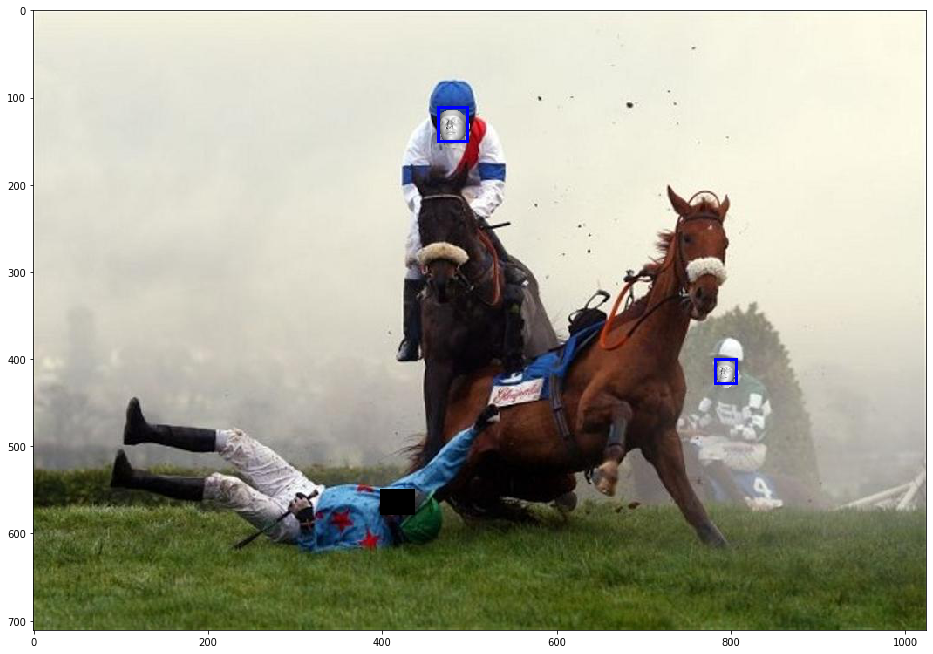

In [8]:
threshold = 0.8
total_imgs = 20

data_iter = iter(lmdb_data_loader)

for j in tqdm(range(total_imgs)):
    torch_img, target = next(data_iter)
    target = target[0]
        
    bboxes = []
    scores = []
    poses = []
    
    img = torch_img[0]
    img = img.squeeze()
    img = transforms.ToPILImage()(img).convert("RGB")
    ori_img = img.copy()
    

    run_img = img.copy()

    w, h = img.size

    min_size = min(w, h)
    max_size = max(w, h)
    
    # run on the original image size
    pose_bb_free_model.fpn_model.module.set_max_min_size(max_size, min_size)

    res = pose_bb_free_model.predict([transform(run_img)])
    res = res[0]

    for i in range(len(res["scores"])):
        if res["scores"][i] > threshold:
            bboxes.append(res["boxes"].cpu().numpy()[i].astype('int'))
            scores.append(res["scores"].cpu().numpy()[i].astype('float'))
            poses.append(res["dofs"].cpu().numpy()[i].astype('float'))
                
    (w, h) = img.size
    image_intrinsics = np.array([[w + h, 0, w // 2], [0, w + h, h // 2], [0, 0, 1]])
    
    plt.figure(figsize=(16, 16))    
    
    poses = np.asarray(poses)
    bboxes = np.asarray(bboxes)
    scores = np.asarray(scores)
    
    if np.ndim(bboxes) == 1 and len(bboxes) > 0:
        bboxes = bboxes[np.newaxis, :]
        poses = poses[np.newaxis, :]        
        
    if len(bboxes) != 0:
        ranked = np.argsort(poses[:, 5])[::-1]
        poses = poses[ranked]
        bboxes = bboxes[ranked]
        scores = scores[ranked]

        for i in range(len(scores)):
            if scores[i] > threshold:
                bbox = bboxes[i]

                pose_pred = poses[i]
                pose_pred = np.asarray(pose_pred.squeeze())        

                trans_vertices = renderer.transform_vertices(img, [pose_pred])
                img = renderer.render(img, trans_vertices, alpha=1)  
                plt.gca().add_patch(patches.Rectangle((bbox[0], bbox[1]), bbox[2] - bbox[0], bbox[3] - bbox[1],linewidth=3,edgecolor='b',facecolor='none'))            
                img = Image.fromarray(img)

        plt.imshow(img)        
        plt.show() 